# SNA Dummy 1

In [ ]:
!pip install -U node2vec

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for node2vec: filename=node2vec-0.4.3-py3-none-any.whl size=5980 sha256=efb0c92d987055e82e2fda3ee811e4a3cc0c2ab78ac24b14c5a7bd27bd31a901
  Stored in directory: /root/.cache/pip/wheels/07/62/78/5202cb8c03cbf1593b48a8a442fca8ceec2a8c80e22318bae9
Successfully built node2vec


In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import json
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
from node2vec import Node2Vec

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import re

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/nolimit/SNA/2020-03-00 Coronavirus Tweets (pre 2020-03-12).CSV')

In [ ]:
df

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,...,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
0,1235160526780416001,1163436067904618496,2020-03-04T11:09:52Z,Nanank08000089,#CoronaVirusIndonesia \n#CoronaBukaBorokRezim ...,Twitter for Android,NaN,NaN,NaN,False,...,0.0,NaN,NaN,NaN,21.0,142.0,NaN,2019-08-19T13:02:45Z,False,und
1,1235160526780416001,1163436067904618496,2020-03-04T11:09:52Z,Nanank08000089,#CoronaVirusIndonesia \n#CoronaBukaBorokRezim ...,Twitter for Android,NaN,NaN,NaN,False,...,0.0,NaN,NaN,NaN,21.0,142.0,NaN,2019-08-19T13:02:45Z,False,und
2,1235160546451873797,2255210942,2020-03-04T11:09:57Z,David_Mulroney,China’s wildlife trade via @SCMPgraphics http...,Twitter for iPad,NaN,NaN,NaN,False,...,2.0,NaN,NaN,NaN,5666.0,2796.0,NaN,2013-12-20T16:14:18Z,False,en
3,1235160597475602432,366491737,2020-03-04T11:10:09Z,MarykeSchoonen,Proof that the media such as @CNN is unnecessa...,Twitter for iPhone,NaN,NaN,NaN,False,...,0.0,NaN,NaN,NaN,41.0,94.0,NaN,2011-09-02T08:22:14Z,False,en
4,1235160647614291968,61557732,2020-03-04T11:10:21Z,Arjit_Garg,Indians are a shitty breed of humans. With the...,Twitter for Android,NaN,NaN,NaN,False,...,0.0,IN,"Greater Noida, India",city,486.0,50.0,NaN,2009-07-30T18:18:25Z,False,en
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46742,1236225104201355264,1388467423,2020-03-07T09:40:07Z,pandemicflucare,Vox guide to Covid-19 coronavirus. ReadMore: h...,Hootsuite Inc.,NaN,NaN,NaN,False,...,0.0,NaN,NaN,NaN,442.0,435.0,NaN,2013-04-29T02:30:51Z,False,en
46743,1236225102473318400,2922557729,2020-03-07T09:40:07Z,roger_pare,#COVIDー19 #CoronavirusOutbreak #CoronaVirusCan...,Twitter for iPhone,NaN,NaN,NaN,True,...,0.0,NaN,NaN,NaN,111.0,1061.0,NaN,2014-12-15T08:02:07Z,False,und
46744,1236225195872043009,1091615382841032704,2020-03-07T09:40:29Z,Wawei16,@NatoliJean1 @lapin47 #COVIDー19 #COVID19 #Coro...,Twitter for Android,1.236181e+18,1.220433e+18,NatoliJean1,False,...,2.0,NaN,NaN,NaN,58.0,91.0,NaN,2019-02-02T08:32:43Z,False,und
46745,1236225236439162881,1218626655490457600,2020-03-07T09:40:38Z,BestOfferZone2,Win A Brand New Iphone 11 and Iphonexs!!!!!!\n...,Twitter Web App,NaN,NaN,NaN,False,...,0.0,NaN,NaN,NaN,24.0,446.0,NaN,2020-01-18T20:10:23Z,False,en


In [ ]:
tweets_by_country = df.groupby('is_quote').country_code.value_counts().unstack(0).reset_index()
tweets_by_country = tweets_by_country.sort_values(by=False, ascending=False)
tweets_by_country.columns = tweets_by_country.columns.astype(str)
tweets_by_country['Total'] = tweets_by_country['False'] + tweets_by_country['True']
tweets_by_country['PCT_False'] = tweets_by_country['False'] / tweets_by_country['Total']
tweets_by_country['PCT_True'] = tweets_by_country['True'] / tweets_by_country['Total']

In [ ]:
tweets_by_country

is_quote,country_code,False,True,Total,PCT_False,PCT_True
79,US,633.0,202.0,835.0,0.758084,0.241916
30,IN,199.0,36.0,235.0,0.846809,0.153191
24,GB,88.0,8.0,96.0,0.916667,0.083333
82,ZA,87.0,11.0,98.0,0.887755,0.112245
33,IT,39.0,6.0,45.0,0.866667,0.133333
...,...,...,...,...,...,...
34,JM,NaN,1.0,NaN,NaN,NaN
43,MA,NaN,1.0,NaN,NaN,NaN
46,MV,NaN,1.0,NaN,NaN,NaN
53,NZ,NaN,1.0,NaN,NaN,NaN


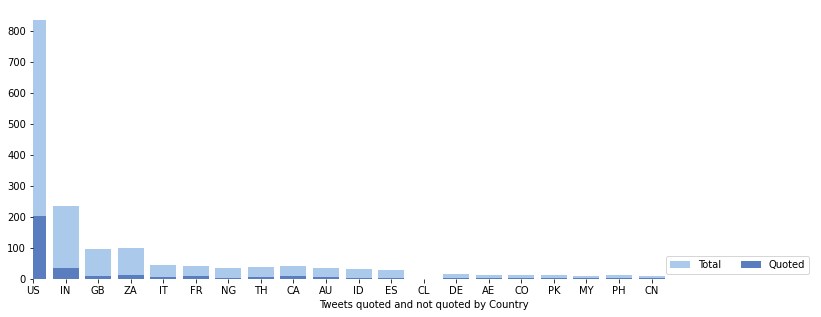

In [ ]:
f, ax = plt.subplots(figsize=(14, 5))

sns.set_color_codes("pastel")
sns.barplot(x="country_code", y="Total", data=tweets_by_country[:20],
            label="Total", color="b")


sns.set_color_codes("muted")
sns.barplot(x="country_code", y="True", data=tweets_by_country[:20],
            label="Quoted", color="b")

ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(0, 24), ylabel="",
       xlabel="Tweets quoted and not quoted by Country")
sns.despine(left=True, bottom=True)

In [ ]:
df['hour'] = pd.to_datetime(df['created_at']).map(lambda x: x.hour)

Text(0.5, 0, 'Hour')

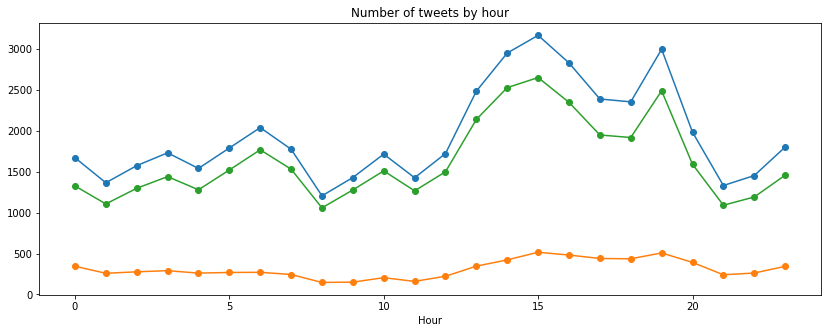

In [ ]:
ax = df['hour'].value_counts().sort_index().plot(figsize=(14,5), marker='o')
df[df['is_quote']==True]['hour'].value_counts().sort_index().plot(figsize=(14,5), marker='o', ax=ax)
df[df['is_quote']==False]['hour'].value_counts().sort_index().plot(figsize=(14,5), marker='o', ax=ax)
ax.set_title('Number of tweets by hour')
ax.set_xlabel('Hour')

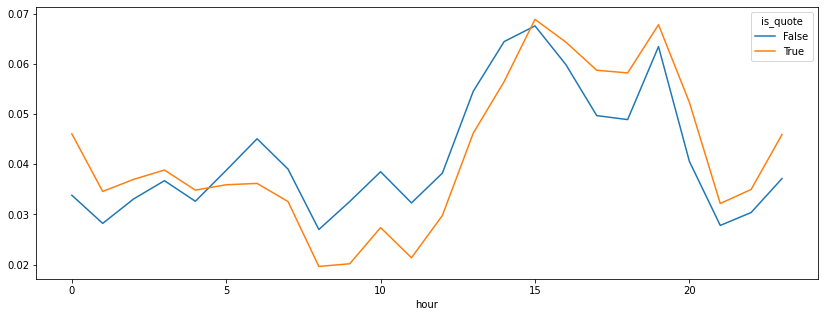

In [ ]:
df.groupby('is_quote').hour.value_counts(normalize=True).unstack(0).plot(figsize=(14,5))

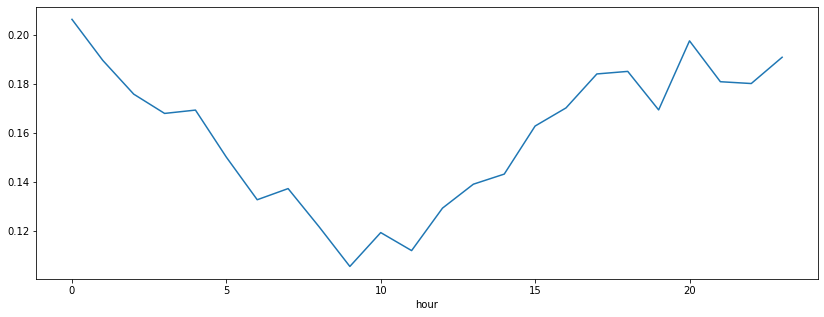

In [ ]:
df.groupby('hour').is_quote.value_counts(normalize=True).unstack(1)[True].plot(figsize=(14,5))

In [ ]:
df['length_text'] = df['text'].map(lambda x: len(x))

In [ ]:
top_countries = tweets_by_country[:5]['country_code'].tolist()

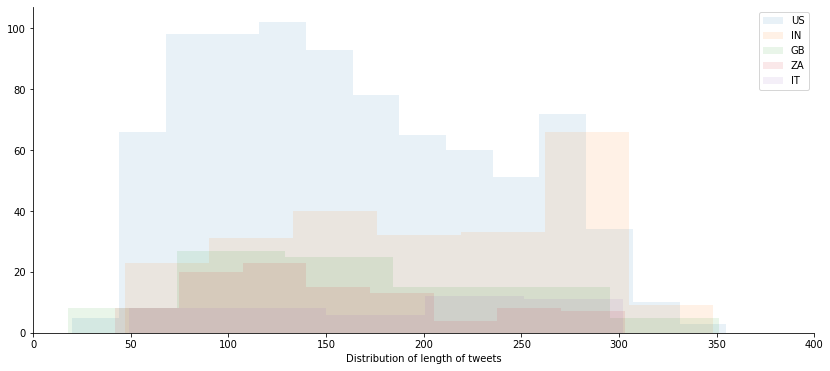

In [ ]:
# Sort the dataframe by target
# Use a list comprehension to create list of sliced dataframes
targets = [df.loc[df['country_code'] == val] for val in top_countries]

# Iterate through list and plot the sliced dataframe

f, ax = plt.subplots(figsize=(14, 6))

for target in targets:
    sns.distplot(target[['length_text']], hist=True, rug=False,
                 kde=False, hist_kws=dict(alpha=0.1), label=target['country_code'].unique())

ax.legend(ncol=1, loc="upper right", frameon=True)
ax.set(xlim=(0, 400), ylabel="",
       xlabel="Distribution of length of tweets")
sns.despine(right=True, top=True)
plt.show()

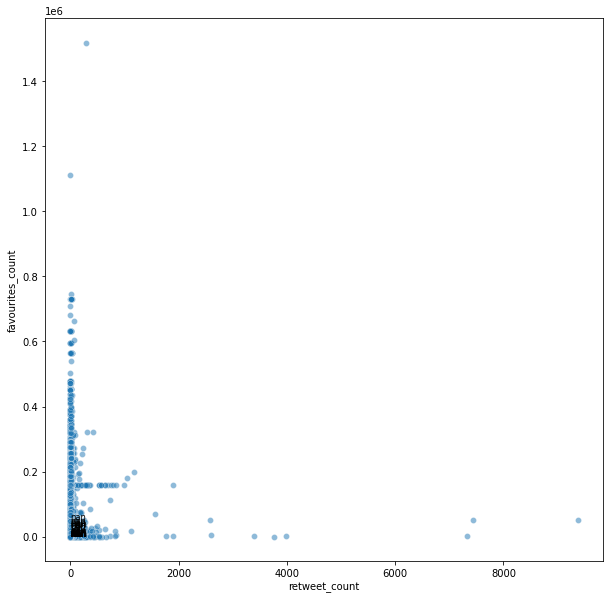

In [ ]:
cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)

plt.figure(figsize=(10,10))
ax = sns.scatterplot(x='retweet_count', y='favourites_count', data=df, alpha = 0.5)

for line in range(0,tweets_by_country.shape[0]):
     ax.text(df['retweet_count'][line], df['favourites_count'][line], df['country_code'][line],
             horizontalalignment='left', size='small', color='black')

In [ ]:
def extract(start, tweet):

    words = tweet.split()
    return [word[1:] for word in words if word[0] == start]

def strip_punctuation(s):
    return s.translate(str.maketrans('','','!"$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'))

def extract_hashtags(tweet):
    hashtags = [strip_punctuation(tag) for tag in extract('#', tweet)]

    result = []
    for tag in hashtags:
        if tag.lower() not in result:
            result.append(tag.lower())
    return result

In [ ]:
df['hashtags'] = df['text'].apply(extract_hashtags)
df2 = df[['text', 'hashtags', 'country_code']]
df2 = df2[[len(p)>1 for p in df2['hashtags']]]
df2.head()

,text,hashtags,country_code
0,#CoronaVirusIndonesia \n#CoronaBukaBorokRezim ...,"[coronavirusindonesia, coronabukaborokrezim, c...",NaN
1,#CoronaVirusIndonesia \n#CoronaBukaBorokRezim ...,"[coronavirusindonesia, coronabukaborokrezim, c...",NaN
2,China’s wildlife trade via @SCMPgraphics http...,"[2020, covid19, coronavirusoutbreak, coronavir...",NaN
3,Proof that the media such as @CNN is unnecessa...,"[coronavirusoutbreak, royaltour1947, insolentf...",NaN
4,Indians are a shitty breed of humans. With the...,"[coronavirusoutbreak, coronavirusreachesdelhi]",IN


In [ ]:
country='US'

list_Hashtags = df2[df2.country_code==country]['hashtags'].tolist()

H = nx.DiGraph()

for L in list_Hashtags:
    for i in range(len(L)):
        for j in range(i,len(L)):
            H.add_edge(L[i], L[j])

In [ ]:
print('Number of nodes: {}'.format(H.number_of_nodes()))
print('Number of edges: {}'.format(H.number_of_edges()))

Number of nodes: 755
Number of edges: 4591


In [ ]:
def get_strongly_cc(G, node):
    """ get storngly connected component of node"""
    for cc in nx.strongly_connected_components(G):
        if node in cc:
            return cc
    else:
        return set()

def get_weakly_cc(G, node):
    """ get weakly connected component of node"""
    for cc in nx.weakly_connected_components(G):
        if node in cc:
            return cc
    else:
        return set()


def connected_component_subgraphs(G):
    """ get all connected component of node"""
    for c in nx.connected_components(G):
        yield G.subgraph(c)


def get_strongly_gcc(G):
    """ get the giant strongly connected component of G"""
    SGcc = []
    for node in G.nodes():
        strong_component = get_strongly_cc(G, node)
        if len(strong_component) > len(SGcc):
            SGcc = strong_component
    return SGcc

def get_weakly_gcc(G):
    """ get the giant weakly connected component of G"""
    WGcc = []
    for node in G.nodes():
        strong_component = get_weakly_cc(G, node)
        if len(strong_component) > len(WGcc):
            WGcc = strong_component
    return WGcc

In [ ]:
SGH1 = get_strongly_gcc(H)
SGH1 = H.subgraph(SGH1)

In [ ]:
degrees_h = H.degree()

nodes_highest_degree = [n for (n, deg) in degrees_h if degrees_h[n] > 10]
H_highest = H.subgraph(nodes_highest_degree)

degrees_highest = H_highest.degree()

In [ ]:
print('Number of nodes: {}'.format(SGH1.number_of_nodes()))
print('Number of edges: {}'.format(SGH1.number_of_edges()))

Number of nodes: 289
Number of edges: 2192


In [ ]:
# SGH2 = sorted(connected_component_subgraphs(H), key=len, reverse=True)[0]

# print('Number of nodes: {}'.format(SGH2.number_of_nodes()))
# print('Number of edges: {}'.format(SGH2.number_of_edges()))

In [ ]:
degrees_h = SGH1.degree()

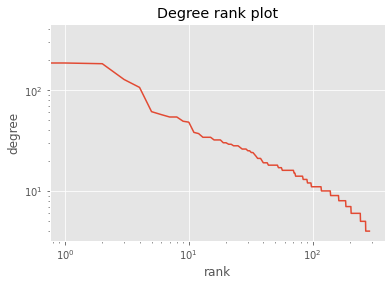

In [ ]:
with plt.style.context('ggplot'):

    plt.loglog(sorted([n[1] for n in list(degrees_h)], reverse=True))
    plt.title("Degree rank plot")
    plt.ylabel("degree")
    plt.xlabel("rank")

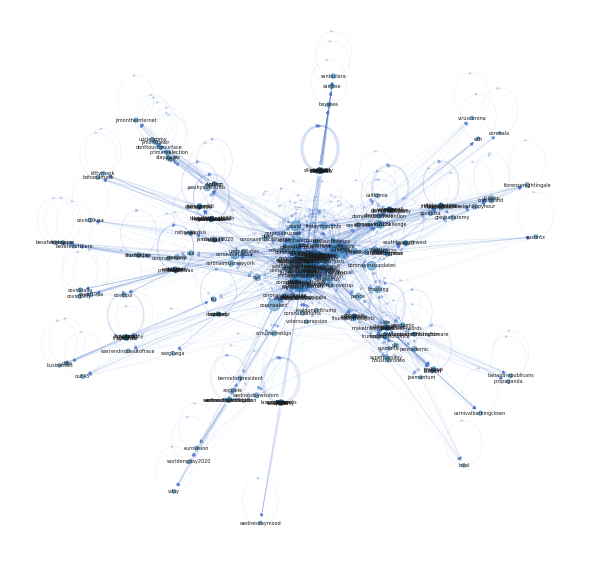

In [ ]:
plt.figure(num=None, figsize=(15, 15), dpi=50, facecolor='w', edgecolor='k')

pos = nx.spring_layout(H_highest)

# nodes
nx.draw_networkx_nodes(H_highest, pos, nodelist=dict(degrees_highest).keys(),
                       node_size=[v * 3 for v in dict(degrees_highest).values()], alpha=0.5)

# edges
nx.draw_networkx_edges(H_highest, pos, width=0.3, alpha=0.3, edge_color='b')

# labels
nx.draw_networkx_labels(H_highest, pos, font_size=7, font_family='sans-serif')

plt.axis('off')
plt.show()

In [ ]:
nodes = df[['user_id', 'country_code']].drop_duplicates().dropna()

In [ ]:
edges = df[~df['reply_to_user_id'].isna()][['user_id', 'reply_to_user_id']].drop_duplicates()

In [ ]:
edges

,user_id,reply_to_user_id
21,225012752,2.250128e+08
22,1228134541019295744,3.934437e+07
37,6509832,6.509832e+06
42,18210270,2.097571e+06
51,18210270,1.652541e+06
...,...,...
46721,4591356563,1.181833e+18
46723,1064597105740840960,2.067568e+07
46728,2328890659,9.342812e+17
46733,1083818792742998016,1.104822e+18


In [ ]:
nodes = pd.merge(nodes, edges.groupby('user_id').count().rename(columns={'reply_to_user_id': 'out'}), how='left',
            left_on='user_id', right_on='user_id').fillna(0)

nodes = pd.merge(nodes, edges.groupby('reply_to_user_id').count().rename(columns={'user_id': 'in'}), how='left',
            left_on='user_id', right_on='reply_to_user_id').fillna(0)

nodes = nodes[nodes['in'] > 0]
nodes = nodes[nodes['out'] > 0]

In [ ]:
nodes

,user_id,country_code,out,in
32,784280066,IT,1.0,1.0
38,937437777372831744,US,1.0,1.0
40,18838745,US,1.0,1.0
106,1653167953,US,1.0,1.0
143,2917213795,US,1.0,1.0
153,300518550,US,1.0,1.0
175,43296617,IN,1.0,1.0
276,2849477994,ID,1.0,1.0
283,1137859974569181184,US,1.0,1.0
293,28913001,US,1.0,1.0


In [ ]:
G = nx.from_pandas_edgelist(edges, 'user_id', 'reply_to_user_id', create_using=nx.DiGraph())
nx.set_node_attributes(G, pd.Series(nodes['in'].to_list(), index=nodes.user_id).to_dict(), 'in')
nx.set_node_attributes(G, pd.Series(nodes['out'].to_list(), index=nodes.user_id).to_dict(), 'out')
nx.set_node_attributes(G, pd.Series(nodes['country_code'].to_list(), index=nodes.user_id).to_dict(), 'country')

In [ ]:
print('Number of nodes: {}'.format(G.number_of_nodes()))
print('Number of edges: {}'.format(G.number_of_edges()))

Number of nodes: 8677
Number of edges: 6717


In [ ]:
nodes_us = [x for x,y in G.nodes(data=True) if ('country' in y.keys() and 'US' in y['country'])]

In [ ]:
nodes_us

[937437777372831744,
 1653167953,
 300518550,
 2430876463,
 28913001,
 2877587633,
 142524023,
 21166230,
 3252948650,
 15137706,
 2917213795,
 85523608,
 3123512661,
 245157270,
 1699793220,
 298104693,
 2180766235,
 1554224654,
 904853688262418432,
 1136030995,
 38751027,
 1198208899,
 18838745,
 1117682787870490624]

In [ ]:
G_US = G.subgraph(nodes_us)

In [ ]:
degrees_us = G_US.degree()

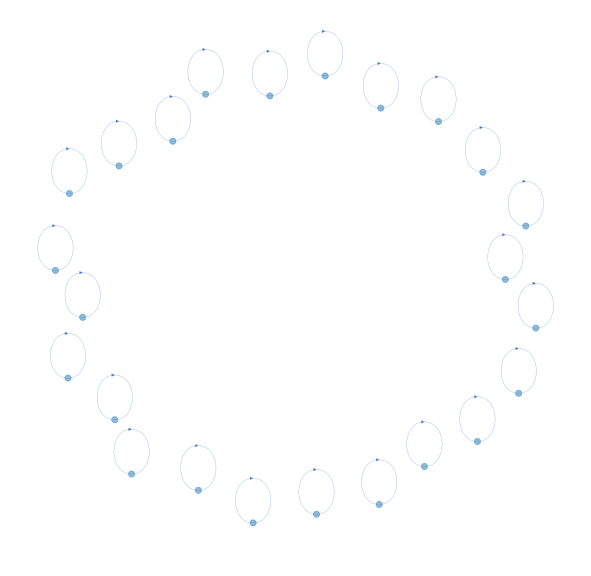

In [ ]:
plt.figure(num=None, figsize=(15, 15), dpi=50, facecolor='w', edgecolor='k')

pos = nx.spring_layout(G_US)

# nodes
nx.draw_networkx_nodes(G_US, pos, nodelist=dict(degrees_us).keys(),
                       node_size=[v * 40 for v in dict(degrees_us).values()], alpha=0.5)

# edges
nx.draw_networkx_edges(G_US, pos, width=0.3, alpha=1, edge_color='b')

plt.axis('off')
plt.show()

In [ ]:
print('Number of nodes: {}'.format(G_US.number_of_nodes()))
print('Number of edges: {}'.format(G_US.number_of_edges()))

Number of nodes: 24
Number of edges: 24


In [ ]:
n2v_obj = Node2Vec(H_highest, dimensions=10, walk_length=5, num_walks=10, p=1, q=1, workers=1)

Computing transition probabilities:   0%|          | 0/254 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 10/10 [00:00<00:00, 10.48it/s]


In [ ]:
n2v_model = n2v_obj.fit(window=3, min_count=1, batch_words=4)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def get_embeddings(model, nodes):
    """Extract representations from the node2vec model"""
    embeddings = [list(model.wv.get_vector(n)) for n in nodes]
    embeddings = np.array(embeddings)
    print(embeddings.shape)
    return embeddings

def dim_reduction(embeddings, labels, frac=None, tsne_obj=TSNE(n_components=2)):
    """Dimensionality reduction with t-SNE. Sampling random instances is supported."""
    N = len(embeddings)
    print(N)
    if frac != None:
        idx = np.random.randint(N, size=int(N*frac))
        X = embeddings[idx,:]
        X_labels = [labels[i] for i in idx]
    else:
        X = embeddings
        X_labels = labels
    X_embedded = tsne_obj.fit_transform(X)
    print("t-SNE object was trained on %i records!" % X.shape[0])
    print(X_embedded.shape)
    return X_embedded, X_labels

def visu_embeddings(X_embedded, X_labels=None, colors = ['r','b']):
    if X_labels != None:
        label_map = {}
        for i, l in enumerate(usr_tsne_lab):
            if not l in label_map:
                label_map[l] = []
            label_map[l].append(i)
        fig, ax = plt.subplots(figsize=(15,15))
        for i, lab in enumerate(label_map.keys()):
            print(lab)
            idx = label_map[lab]
            x = list(X_embedded[idx,0])
            y = list(X_embedded[idx,1])
            #print(len(x),len(y))
            ax.scatter(x, y, c=colors[i], label=lab, alpha=0.5, edgecolors='none')
        plt.legend()
    else:
        plt.figure(figsize=(15,15))
        x = list(X_embedded[:,0])
        y = list(X_embedded[:,1])
        plt.scatter(x, y, alpha=0.5)

In [ ]:
for node, _ in n2v_model.most_similar('coronavirus'):
    # Show only players
    if len(node) > 3:
        print(node)

coronaviruscalifornia
innovation
liveevents
corona
vote
disease
supertuesdsy
masks
coronavirusflorida


In [ ]:
embeddings = [list(n2v_model.wv.get_vector(n)) for n in H_highest.nodes]
embeddings = np.array(embeddings)
print(embeddings.shape)

(254, 10)


In [ ]:
embeddings =get_embeddings(n2v_model, H_highest.nodes)

(254, 10)


In [ ]:
H_highest.nodes()

NodeView(('dune', 'hysteria', 'tradeshow', 'breakingnews', 'pencepandemic', 'realdonaldtrump', 'covid', 'first', 'handwashing', 'asktheq', 'supermarket', 'bananarepublicans', 'california', 'wwg1wga', 'apple', 'propaganda', 'coronaviruscanada', 'trump', 'death', 'masks', 'austintexas', 'coronavirusny', 'tacomask', 'coronavirusus', 'kittymask', 'dialin', 'houston', 'unitedstates', 'travel', 'wednesdaythoughts', 'texas', 'groceryshopping', 'flotus', 'florencenightingale', 'intuit', 'trumpviruscoverup', 'edtech', 'besafeoutthere', 'coronavirusupdates', 'survivor40', 'ubi', 'potus', 'asthma', 'dhs', 'donaldtrump', 'findacure', 'tx', 'worldengday2020', 'realestate', 'chinacoronavirus', 'wednesdaymood', 'covid19pa', 'eurovision', 'covd19', 'costco', 'nationalcrisis', 'sportsnews', 'vday', 'jimontheinternet', 'votebluetoendthisnightmare', 'qanon', 'sxsw2020', 'vaccine', 'coviditalia', 'coronavirusinindia', 'covid19ny', 'seattle', 'unclejimmy', 'fridayfeels', 'covidー19', 'respiratory', 'covid20

<Figure size 1080x1080 with 0 Axes>

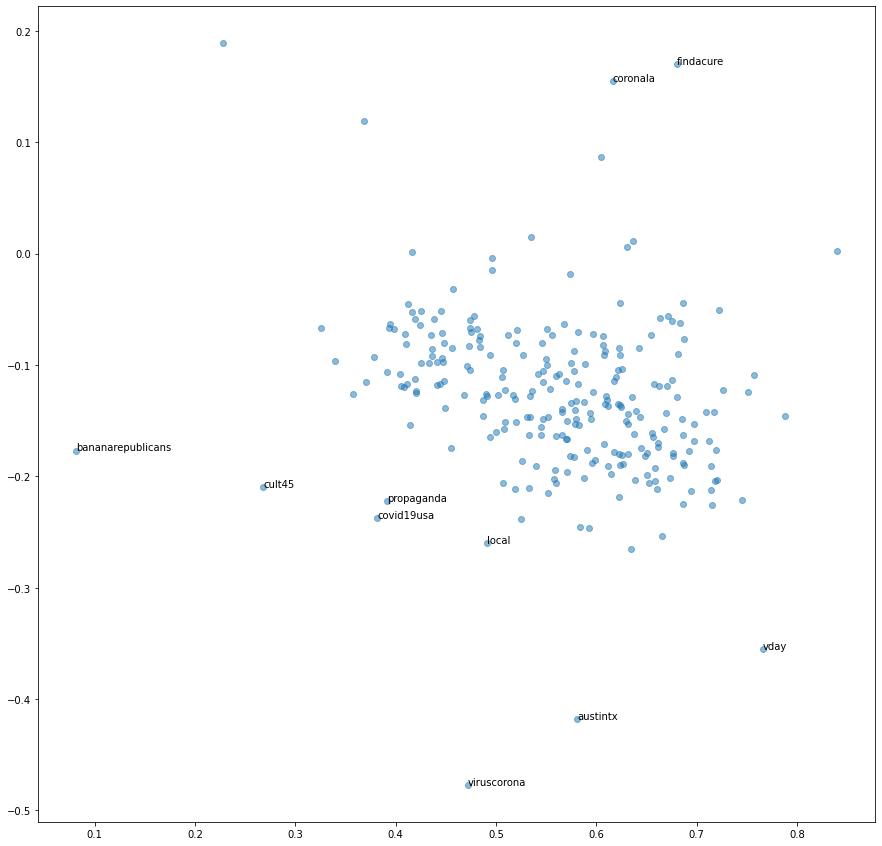

In [ ]:
plt.figure(figsize=(15,15))
x = list(embeddings[:,0])
y = list(embeddings[:,1])

fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(x, y, alpha=0.5)

for i, txt in enumerate(list(H_highest.nodes())):
     if y[i] < -0.3*x[i] -0.1 or  y[i] > -0.3*x[i] + 0.3:
        ax.annotate(txt, (x[i], y[i]))

plt.show()

# SNA 2 (work)

In [ ]:
! pip install networkx
! pip install plotly
! pip install colorlover
! pip install NRCLex
! pip install tweet-preprocessor

import networkx as nx
import pandas as pd
from collections import Counter
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.graph_objects as go
init_notebook_mode(connected=True)
import random
import colorlover as cl
from IPython.display import HTML
from nrclex import NRCLex
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
nltk.download('wordnet')
nltk.download('punkt')
nltk.download("stopwords")

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import preprocessor as p
from IPython.display import Image


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 396 kB 5.9 MB/s 
  Created wheel for NRCLex: filename=NRCLex-3.0.0-py3-none-any.whl size=43329 sha256=2e14f8b6db50c21f8cebe95e81a59744b71c1eea35454214c15aa285a88c4a9b
  Stored in directory: /root/.cache/pip/wheels/af/2c/9c/dfa19d1b65326c520b32850a9311f6d4eda679ac04dba26081
Successfully built NRCLex
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## Loading Data

In [ ]:
%cd /content/drive/MyDrive/nolimit/SNA-DNA/puan/2609

/content/drive/MyDrive/nolimit/SNA-DNA/puan/2609


In [ ]:
!unzip /content/drive/MyDrive/nolimit/SNA-DNA/puan/2609/Puan_Maharani_19-Sep-2022_25-Sep-2022_rflSAO5Lwi.zip

Archive:  /content/drive/MyDrive/nolimit/SNA-DNA/puan/2609/Puan_Maharani_19-Sep-2022_25-Sep-2022_rflSAO5Lwi.zip
  inflating: Puan_Maharani_19-Sep-2022_25-Sep-2022_rflSAO5Lwi_0.csv  
  inflating: Puan_Maharani_19-Sep-2022_25-Sep-2022_rflSAO5Lwi_1.csv  
  inflating: Puan_Maharani_19-Sep-2022_25-Sep-2022_rflSAO5Lwi_2.csv  


In [ ]:
import glob
data = glob.glob('/content/drive/MyDrive/nolimit/SNA-DNA/puan/2609/*.csv')

col_list = ['date_created', 'object_name', 'from_username', 'content']

df1 = pd.read_csv(data[0], sep=';')
df1 = df1[col_list]

df2 = pd.read_csv(data[1], sep=';')
df2 = df2[col_list]

df3 = pd.read_csv(data[2], sep=';')
df3 = df3[col_list]

# df4 = pd.read_csv(data[3], sep=';')
# df4 = df4[col_list]

# df5 = pd.read_csv(data[4], sep=';')
# df5 = df5[col_list]

# df6 = pd.read_csv(data[5], sep=';')
# df6 = df5[col_list]

# df7 = pd.read_csv(data[6], sep=';')
# df7 = df5[col_list]

# df8 = pd.read_csv(data[7], sep=';')
# df8 = df5[col_list]


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning:

Columns (47,929) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
# df6 = pd.read_csv('https://www.dropbox.com/s/ghexaln4aklp94n/Sandi.csv?dl=1', sep=';')
# df7 = pd.read_csv('https://www.dropbox.com/s/osv643mzbcmet5d/RK.csv?dl=1', sep=';')
# df8 = pd.read_csv('https://www.dropbox.com/s/xtwmblmm2ilk94q/Prabowo.csv?dl=1', sep=';')
# df9 = pd.read_csv('https://www.dropbox.com/s/mu0n3bou5c95wsq/Ganjar%201-11%20Aug.csv?dl=1', sep=';')
# df10 = pd.read_csv('https://www.dropbox.com/s/izxt913409jf2lp/Anies%20.csv?dl=1', sep=';')

In [ ]:
# df6 = df6[col_list]
# df7 = df7[col_list]
# df8 = df8[col_list]
# df9 = df9[col_list]
# df10 = df10[col_list]

In [ ]:
df = pd.concat([df1,df2,df3])

In [ ]:
# df = pd.read_csv("/content/drive/MyDrive/nolimit/SNA-DNA/ridwankamil_Politik_22-Jul-2022_22-Aug-2022_UhDEXkZoSw_0.csv",
#                  sep=';')

# # df1 = pd.read_csv("/content/drive/MyDrive/nolimit/SNA-DNA/anies_Politik_22-Jul-2022_22-Aug-2022_YMyMdlMs0o_0.csv",
# #                   sep=';')

# # df2 = pd.read_csv("/content/drive/MyDrive/nolimit/SNA-DNA/anies_Politik_22-Jul-2022_22-Aug-2022_YMyMdlMs0o_1.csv",
# #                   sep=';')

# # df3 = pd.read_csv("/content/drive/MyDrive/nolimit/SNA-DNA/anies_Politik_22-Jul-2022_22-Aug-2022_YMyMdlMs0o_2.csv",
# #                   sep=';')

# # df4 = pd.read_csv("/content/drive/MyDrive/nolimit/SNA-DNA/erick_Politik_23-Jul-2022_23-Aug-2022_K1pQpNQuUo_3.csv",
# #                   sep=';')

In [ ]:
# df = pd.read_excel('/content/drive/MyDrive/nolimit/SNA-DNA/Pilpres di undur.xlsx')

In [ ]:
# df.to_csv('/content/drive/MyDrive/nolimit/SNA-DNA/anies_Politik_22-Jul-2022_22-Aug-2022_YMyMdlMs0o.csv', index=False)

In [ ]:
# df = df[['date_created', 'object_name', 'from_username', 'content']]

In [ ]:
# df.head()

In [ ]:
print("Num of rows in df:", df.shape[0])

Num of rows in df: 293235


## Finding most common hashtags

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293235 entries, 0 to 93234
Data columns (total 4 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   date_created   293235 non-null  object
 1   object_name    293235 non-null  object
 2   from_username  293235 non-null  object
 3   content        293235 non-null  object
dtypes: object(4)
memory usage: 11.2+ MB


In [ ]:
allTweets = df["content"].str.cat(sep=' ')
tweetWords = [word.strip(""" ,.:'\";""").lower() for word in allTweets.split()]
hashTags = [word for word in tweetWords if word.startswith("#")]
hashTagsCounter = Counter(hashTags)

In [ ]:
print('\n ############### Most frequent hashtags are = ############### \n')

hashTagsCounter


 ############### Most frequent hashtags are = ############### 



Counter({'#demokratprorakyat': 410,
         '#indonesia': 346,
         '#jokowidodo': 101,
         '#demokratbersamarakyat': 337,
         '#newsone': 55,
         '#cariberitaditvone': 68,
         '#aniesbaswedan': 2963,
         '#pemiluserentak2024': 20,
         '#prabowo': 158,
         '#prabowosubianto': 423,
         '#menhanprabowo': 52,
         '#psjanganmenyerah': 19,
         '#prabowopalinglayak': 24,
         '#unhan': 29,
         '#kemhan': 42,
         '#31stbloomingdae': 216,
         '#chen': 286,
         '#blackpink': 212,
         '#shopping': 85,
         '#queenelizabeth': 185,
         '#queensfunera': 13,
         '#2024aniespresiden': 133,
         '#anieskeren': 233,
         '#aniespresiden2024': 4985,
         '#aniesforpresiden': 214,
         '#pollingilc': 3219,
         '#ganjarpranowo': 2103,
         '#mencuriradensaleh': 479,
         '#첸_가을밤을_수놓은_별': 26,
         '#thaicaverescuenetflix': 26,
         '#weareoneexo': 26,
         '#papuasejaht

In [ ]:
hashTagsCounter.most_common(100)

[('#bangkitbersamaet', 17855),
 ('#gusmuhaiminfestjateng', 9182),
 ('#aniespresiden2024', 4985),
 ('#prabowoperkuatpertahanan', 4109),
 ('#capresmumpuni', 3514),
 ('#pollingilc', 3219),
 ('#aniesbaswedan', 2963),
 ('#jatenggayeng', 2253),
 ('#jalancantik', 2115),
 ('#ganjarpranowo', 2103),
 ('#dpruntuknegeri', 2014),
 ('#anies', 1685),
 ('#sahabatganjar', 1664),
 ('#sobataniesnasional', 1629),
 ('#pollingpilpres', 1401),
 ('#ridwankamil', 1280),
 ('#jabarjuara', 1233),
 ('#jatenglawancorona', 1178),
 ('#bersamalawancorona', 1175),
 ('#jagankri', 1133),
 ('#ganjar', 1082),
 ('#ganjaranapps', 1034),
 ('#makasihsbydukungahy', 966),
 ('#ruupdp', 935),
 ('#perlindungandatapribadi', 914),
 ('#indonesiajuara', 905),
 ('#sandiagauno', 891),
 ('#erickthohirjujurbersih', 886),
 ('#2024singkirkanpdip', 861),
 ('#etsolusibumnmaju', 836),
 ('#sandiuno', 798),
 ('#pplhiupdate_2016', 788),
 ('#pplhiupdate_2020', 786),
 ('#puanmaharani', 781),
 ('#pplhirkri1', 687),
 ('#jatengpedulisesama', 631),
 ('#

In [ ]:
top = dict(hashTagsCounter.most_common(100))

In [ ]:
top = list(top.keys())

In [ ]:
# top.append('#puanmaharani')

In [ ]:
# pakai top 100
tag = df[df["content"].str.lower().str.contains("|".join(top), na=False)].copy()

In [ ]:
# # pakai manual
# tag = df[df["content"].str.lower().str.contains("puan maharani|puan|puan_maharani", na=False)].copy()

In [ ]:
tag

,date_created,object_name,from_username,content
10,24/09/2022 16.20,'Ketua Umum Partai Demokrat,'AqyaBonita,'Ketua Umum Partai Demokrat AHY ajak kader2nya...
23,24/09/2022 18.33,'menhan,'TitikTerangNews,'Menteri Pertahanan (Menhan) Prabowo Subianto ...
30,23/09/2022 22.27,'Ketua Umum Partai Demokrat,'Braderhood16,'Pembangunan SDM Kunci Kemajuan Negara &amp; K...
56,23/09/2022 14.44,'Ketua Umum Partai Demokrat,'KakDavy,'Wakil Ketua Umum Partai Demokrat Benny K. Har...
71,22/09/2022 21.49,'menhan,'inewsdotid,'Momen Menhan Berdialog dengan Mahasiswa Unhan...
...,...,...,...,...
93227,22/09/2022 08.31,'aniesbaswedan,'aniesbaswedan,'Selamat pagi dari Taman Literasi Martha Tiaha...
93228,21/09/2022 19.00,'aniesbaswedan,'aniesbaswedan,"'Ini Jakarta! 📍Kawasan Batavia Kota Tua, Jaka..."
93229,20/09/2022 15.45,'aniesbaswedan,'aniesbaswedan,'Inilah wajah baru Taman Literasi Martha Tiaha...
93232,19/09/2022 20.15,'aniesbaswedan,'aniesbaswedan,'Menerima Ketua Federasi Panjat Tebing Indones...


In [ ]:
tag['content'].duplicated().sum()

39386

In [ ]:
tag = tag.drop_duplicates(subset=['content']).reset_index(drop=True)

## How many nodes and how many edges are in your mention graph?

In [ ]:
############### Function to add mentioned column

def addMentionedColumn(tag):

    def mentionsList(txt):
        allWords = [word.strip(""" ,.:'\";""").lower() for word in txt.split()]
        allNames = [word.strip("@") for word in allWords if word.startswith("@")]
        uniqueNames = list(set(allNames))

        allNames = ' '.join([str(elem) for elem in allNames])
        return uniqueNames

    tag["mentioned"] = tag["content"].apply(mentionsList)

In [ ]:
############### Getting the mentioned tag

addMentionedColumn(tag)

In [ ]:
tag = tag.reset_index(drop=True)

In [ ]:
tag.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31884 entries, 0 to 31883
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date_created   31884 non-null  object
 1   object_name    31884 non-null  object
 2   from_username  31884 non-null  object
 3   content        31884 non-null  object
 4   mentioned      31884 non-null  object
dtypes: object(5)
memory usage: 1.2+ MB


In [ ]:
tag

,date_created,object_name,from_username,content,mentioned
0,24/09/2022 16.20,'Ketua Umum Partai Demokrat,'AqyaBonita,'Ketua Umum Partai Demokrat AHY ajak kader2nya...,[]
1,24/09/2022 18.33,'menhan,'TitikTerangNews,'Menteri Pertahanan (Menhan) Prabowo Subianto ...,[]
2,23/09/2022 22.27,'Ketua Umum Partai Demokrat,'Braderhood16,'Pembangunan SDM Kunci Kemajuan Negara &amp; K...,[]
3,23/09/2022 14.44,'Ketua Umum Partai Demokrat,'KakDavy,'Wakil Ketua Umum Partai Demokrat Benny K. Har...,[]
4,22/09/2022 21.49,'menhan,'inewsdotid,'Momen Menhan Berdialog dengan Mahasiswa Unhan...,[]
...,...,...,...,...,...
31879,19/09/2022 02.12,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Senin, 19 September 20...","[beritajakarta, dkijakarta, bpbdjakarta, dinas..."
31880,19/09/2022 01.50,'aniesbaswedan,'s_sunjoyo,'Peresmian Taman Literasi Martha Christina Tia...,[aniesbaswedan]
31881,19/09/2022 01.20,'aniesbaswedan,'bautNKRI,'@AkuAtikaFaya @AZIR08845903 @aniesbaswedan #B...,"[azir08845903, akuatikafaya, aniesbaswedan]"
31882,19/09/2022 01.12,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Senin, 19 September 20...","[beritajakarta, dkijakarta, bpbdjakarta, dinas..."


In [ ]:
tag['content'].duplicated().sum()

0

In [ ]:
tag = tag.drop_duplicates(subset=['content']).reset_index(drop=True)

In [ ]:
tag

,date_created,object_name,from_username,content,mentioned
0,24/09/2022 16.20,'Ketua Umum Partai Demokrat,'AqyaBonita,'Ketua Umum Partai Demokrat AHY ajak kader2nya...,[]
1,24/09/2022 18.33,'menhan,'TitikTerangNews,'Menteri Pertahanan (Menhan) Prabowo Subianto ...,[]
2,23/09/2022 22.27,'Ketua Umum Partai Demokrat,'Braderhood16,'Pembangunan SDM Kunci Kemajuan Negara &amp; K...,[]
3,23/09/2022 14.44,'Ketua Umum Partai Demokrat,'KakDavy,'Wakil Ketua Umum Partai Demokrat Benny K. Har...,[]
4,22/09/2022 21.49,'menhan,'inewsdotid,'Momen Menhan Berdialog dengan Mahasiswa Unhan...,[]
...,...,...,...,...,...
31879,19/09/2022 02.12,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Senin, 19 September 20...","[beritajakarta, dkijakarta, bpbdjakarta, dinas..."
31880,19/09/2022 01.50,'aniesbaswedan,'s_sunjoyo,'Peresmian Taman Literasi Martha Christina Tia...,[aniesbaswedan]
31881,19/09/2022 01.20,'aniesbaswedan,'bautNKRI,'@AkuAtikaFaya @AZIR08845903 @aniesbaswedan #B...,"[azir08845903, akuatikafaya, aniesbaswedan]"
31882,19/09/2022 01.12,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Senin, 19 September 20...","[beritajakarta, dkijakarta, bpbdjakarta, dinas..."


In [ ]:
############### Funciton to build a mention graph

def mentionGraph(tag):
    g = nx.Graph()

    for (index, date, user, tweet, mentionedUsers) in tag.itertuples():
        for mentionedUser in mentionedUsers:
            if (user in g) and (mentionedUser in g[user]):
                g[user][mentionedUser]["numberMentions"] += 1
            else:
                g.add_edge(user, mentionedUser, numberMentions=1)

    return g

In [ ]:
tagGraph = mentionGraph(tag.drop(columns=['object_name']))

print('\n ############### Number of nodes and edges are = ############### \n')

print("# nodes:", len(tagGraph.nodes()))
print("# edges:", len(tagGraph.edges()))


 ############### Number of nodes and edges are = ############### 

# nodes: 12017
# edges: 32201


## Build a histogram of the graph nodes' degree **(opsional)**

In [ ]:
############### Getting pandas df from the degree dictionary of the graph

degree_dict = dict(nx.degree(tagGraph))
degree_dict_df = pd.DataFrame.from_dict(degree_dict, orient='index', columns = ['degree']).sort_values(by = 'degree', ascending = False)

In [ ]:
degree_dict_df

,degree
prabowo,451
gerindra,399
puanmaharani_ri,94
'kacamo_cat,66
jokowi,49
...,...
musniumar,1
tatakujiyati,1
setiyo_welly,1
sukasukasapa,1


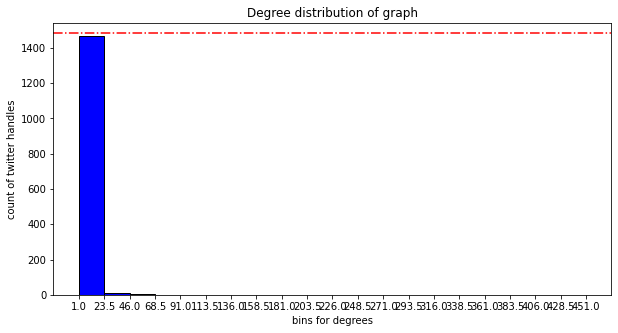

In [ ]:
############### Building a histogram of degree distribution

fig, ax = plt.subplots(figsize=(10,5))

counts, bins, patches = ax.hist(degree_dict_df['degree'], facecolor='blue', edgecolor='black', bins = 20)
ax.set_xticks(bins)
ax.set_xlabel('bins for degrees')
ax.set_ylabel('count of twitter handles')
ax.set_title('Degree distribution of graph')
plt.axhline(y=len(tagGraph.nodes()), color='r', linestyle='-.')

plt.show()

**Note** = The dotted line in the plot above shows the total nodes in the graph

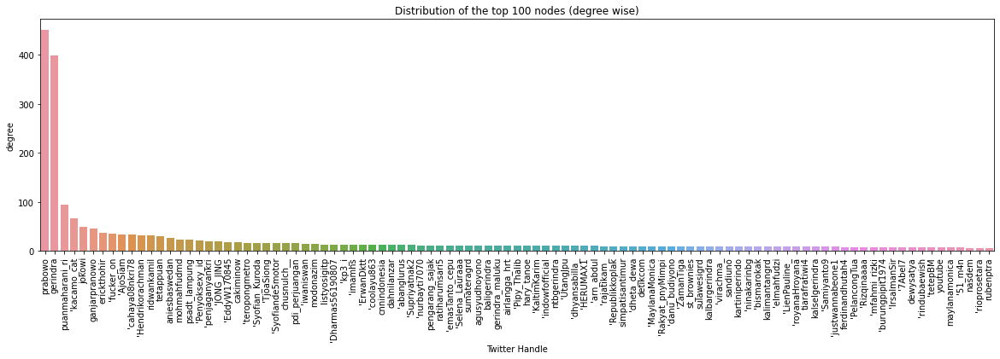

In [ ]:
############### Building histogram of the degree distribution

fig, ax = plt.subplots(figsize=(20,5))
plt.xticks(rotation = 90)
plt.xlabel('Twitter Handle')
plt.ylabel('degree')
plt.title('Distribution of the top 100 nodes (degree wise)')

ax = sns.barplot(x=degree_dict_df.index[0:100], y=degree_dict_df['degree'][0:100])

In [ ]:
print('\n ############### top 3 nodes with most degrees = ############### \n')

print(degree_dict_df.index[0:3])


 ############### top 3 nodes with most degrees = ############### 

Index(['prabowo', 'gerindra', 'puanmaharani_ri'], dtype='object')


In [ ]:
############### getting fraction of nodes with that degree

node_fract_dict = dict(Counter(degree_dict_df['degree'].values))
node_fract_df = pd.DataFrame.from_dict(node_fract_dict, orient='index', columns = ['number_of_nodes'])
node_fract_df['degree'] = node_fract_df.index
node_fract_df.reset_index(drop=True)

node_fract_df['fraction_of_nodes'] = node_fract_df['number_of_nodes']/node_fract_df['number_of_nodes'].sum()

# assert(node_fract_df['fraction_of_nodes'].sum() == 1.0)

node_fract_df.head(3)

,number_of_nodes,degree,fraction_of_nodes
451,1,451,0.000675
399,1,399,0.000675
94,1,94,0.000675


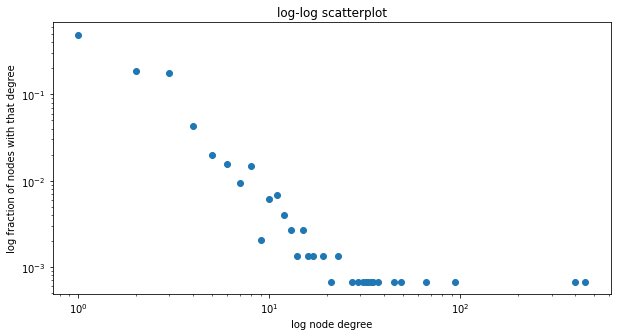

In [ ]:
############### Building log log scatter plot

fig, ax = plt.subplots(figsize=(10,5))
# ax = plt.gca()
ax.scatter(node_fract_df['degree'] ,node_fract_df['fraction_of_nodes'])
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_xlabel('log node degree')
ax.set_ylabel('log fraction of nodes with that degree')
ax.set_title('log-log scatterplot')

plt.show()

## For the highest-weighted edge **(opsional)**

In [ ]:
############### Getting the nodes with the highest mentions (edge weight)

max_edge_weight_tuple = max(dict(tagGraph.edges).items(), key=lambda x: x[1]['numberMentions'])

print('\n ############### tuple with max edge weight is = ############### \n')

max_edge_weight_tuple

#reference - https://stackoverflow.com/questions/52440518/finding-maximum-weighted-edge-in-a-networkx-graph-in-python


 ############### tuple with max edge weight is = ############### 



(('erickthohir', "'Selena_Lauraaa"), {'numberMentions': 340})

In [ ]:
df

,date_created,object_name,from_username,content,mentioned
0,12/08/2022 23.36,'AIRLANGGA HARTARTO,'AIRLANGGA HARTARTO,'#AirlanggaHartarto #ZulkifliHasan #SuharsoMonoarfa,[]
1,12/08/2022 22.01,'AIRLANGGA HARTARTO,'AIRLANGGA HARTARTO,'#AirlanggaHartarto #KoalisiIndonesiaBersatu #KerjaUntukIndonesia,[]
2,10/08/2022 18.30,'AIRLANGGA HARTARTO,'AIRLANGGA HARTARTO,'#AirlanggaHartarto #WulingAirev #KerjaUntukIndonesia,[]
3,10/08/2022 12.30,'AIRLANGGA HARTARTO,'AIRLANGGA HARTARTO,'#AirlanggaHartarto #PondokBuntet #KerjaUntukIndonesia,[]
4,14/08/2022 15.24,'jenderaltniandikaperkasa,'jenderaltniandikaperkasa,"'Militer Indonesia dan Perancis telah menjalin hubungan yang baik dalam berbagai bidang. Panglima TNI menerima penghargaan Ordre National du Merite atas dedikasinya untuk mempererat hubungan Indonesia – Perancis. Penyematan medali dilakukan oleh Panglima Angkatan Bersenjata Perancis, General Thierry Burkhard. Panglima Angkatan Bersenjata Perancis berharap dapat saling mempererat tali silaturahmi antara Indonesia dan Perancis. #andikaperkasa #panglimatni #frencharmedforces #ordrenation...",[]
...,...,...,...,...,...
103305,13/08/2022 17.28,'prabowo,'w413er,'@Dahnilanzar @prabowo @Gerindra Gak ada urat malu nya... haus kekuasaan... bah..!!,"[gerindra, prabowo, dahnilanzar]"
103306,13/08/2022 17.28,'prabowo,'vinrahdian,"'Siap Dukung, Pada Rapimnas, Ketum Partai Gerindra Prabowo Subianto mengatakan bersedia dipilih sebagai Calon 2024. @prabowo @Gerindra Prabowo Subianto 2024 Berjuang Untuk Rakyat Jaga Persatuan Indonesia","[gerindra, prabowo]"
103307,13/08/2022 17.28,'prabowo,'Lessfitr,'Anggota parti tersebut menyatakan hasrat mereka bagi Encik Prabowo bertanding lagi bagi kerusi Presiden Indonesia. @Gerindra @prabowo Prabowo Subianto 2024 Berjuang Untuk Rakyat Jaga Persatuan Indonesia https://t.co/k8wVjkvhRk,"[gerindra, prabowo]"
103308,13/08/2022 17.28,'prabowo,'hendry_defhaya,'@Dahnilanzar @Gerindra @prabowo kecewa parah,"[gerindra, prabowo, dahnilanzar]"


In [ ]:
############### Filtering tweets between these 2 nodes by filtering based on "user" and "mentioned"

df_q2d = tag[(tag['from_username'].isin([max_edge_weight_tuple[0][0]])) | (tag['from_username'].isin([max_edge_weight_tuple[0][1]]))]
df_q2d['mentioned_set'] = df_q2d['mentioned'].apply(lambda x: set(x))
df_q2d = df_q2d[df_q2d['mentioned_set'] - set([max_edge_weight_tuple[0][0], max_edge_weight_tuple[0][1]]) != df_q2d['mentioned_set']]
df_q2d = df_q2d.sort_values(by = 'date_created')

assert(df_q2d.shape[0] == max_edge_weight_tuple[1]['numberMentions'])

df_q2d.head(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date_created,object_name,from_username,content,mentioned,mentioned_set
3438,13/08/2022 08.57,'Puan Maharani,'yuli_bantgpdip,"'RT @TetapPuan: Pengamat Menyebut, Puan Mahara...",[tetappuan],{tetappuan}
3434,13/08/2022 08.58,'Puan Maharani,'yuli_bantgpdip,'RT @TetapPuan: Kebersamaan Jokowi dan Puan pa...,[tetappuan],{tetappuan}
3436,13/08/2022 08.58,'Puan Maharani,'yuli_bantgpdip,'RT @TetapPuan: Pengamat: Kemiripan Jokowi dan...,[tetappuan],{tetappuan}


In [ ]:
############### Printing tweets between these 2 nodes

pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', 500)

df_q2d[['date_created', 'from_username', 'content', 'mentioned']]

,date_created,from_username,content,mentioned
3438,13/08/2022 08.57,'yuli_bantgpdip,"'RT @TetapPuan: Pengamat Menyebut, Puan Maharani-Anies Baswedan Punya Kombinasi Unik dan Saling Melengkapi #TetapPuan #PuanMaharani #Anies…",[tetappuan]
3434,13/08/2022 08.58,'yuli_bantgpdip,'RT @TetapPuan: Kebersamaan Jokowi dan Puan pasca rakernas jadi pertanda Puan Maharani akan diusung pada 2024. #TetapPuan #PuanMaharani #ke…,[tetappuan]
3436,13/08/2022 08.58,'yuli_bantgpdip,'RT @TetapPuan: Pengamat: Kemiripan Jokowi dan Puan Maharani #TetapPuan #PuanMaharani #Jokowi #pdiperjuangan #PDIP https://t.co/8pLRBOODLK,[tetappuan]


In [ ]:
df_q2d

,date_created,object_name,from_username,content,mentioned,mentioned_set
3438,13/08/2022 08.57,'Puan Maharani,'yuli_bantgpdip,"'RT @TetapPuan: Pengamat Menyebut, Puan Maharani-Anies Baswedan Punya Kombinasi Unik dan Saling Melengkapi #TetapPuan #PuanMaharani #Anies…",[tetappuan],{tetappuan}
3434,13/08/2022 08.58,'Puan Maharani,'yuli_bantgpdip,'RT @TetapPuan: Kebersamaan Jokowi dan Puan pasca rakernas jadi pertanda Puan Maharani akan diusung pada 2024. #TetapPuan #PuanMaharani #ke…,[tetappuan],{tetappuan}
3436,13/08/2022 08.58,'Puan Maharani,'yuli_bantgpdip,'RT @TetapPuan: Pengamat: Kemiripan Jokowi dan Puan Maharani #TetapPuan #PuanMaharani #Jokowi #pdiperjuangan #PDIP https://t.co/8pLRBOODLK,[tetappuan],{tetappuan}


## **SNA**

In [ ]:
tag

,date_created,object_name,from_username,content,mentioned
0,24/09/2022 16.20,'Ketua Umum Partai Demokrat,'AqyaBonita,'Ketua Umum Partai Demokrat AHY ajak kader2nya...,[]
1,24/09/2022 18.33,'menhan,'TitikTerangNews,'Menteri Pertahanan (Menhan) Prabowo Subianto ...,[]
2,23/09/2022 22.27,'Ketua Umum Partai Demokrat,'Braderhood16,'Pembangunan SDM Kunci Kemajuan Negara &amp; K...,[]
3,23/09/2022 14.44,'Ketua Umum Partai Demokrat,'KakDavy,'Wakil Ketua Umum Partai Demokrat Benny K. Har...,[]
4,22/09/2022 21.49,'menhan,'inewsdotid,'Momen Menhan Berdialog dengan Mahasiswa Unhan...,[]
...,...,...,...,...,...
31879,19/09/2022 02.12,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Senin, 19 September 20...","[beritajakarta, dkijakarta, bpbdjakarta, dinas..."
31880,19/09/2022 01.50,'aniesbaswedan,'s_sunjoyo,'Peresmian Taman Literasi Martha Christina Tia...,[aniesbaswedan]
31881,19/09/2022 01.20,'aniesbaswedan,'bautNKRI,'@AkuAtikaFaya @AZIR08845903 @aniesbaswedan #B...,"[azir08845903, akuatikafaya, aniesbaswedan]"
31882,19/09/2022 01.12,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Senin, 19 September 20...","[beritajakarta, dkijakarta, bpbdjakarta, dinas..."


In [ ]:
new_tag = tag.explode('mentioned').reset_index(drop=True)

In [ ]:
new_tag

,date_created,object_name,from_username,content,mentioned
0,24/09/2022 16.20,'Ketua Umum Partai Demokrat,'AqyaBonita,'Ketua Umum Partai Demokrat AHY ajak kader2nya...,NaN
1,24/09/2022 18.33,'menhan,'TitikTerangNews,'Menteri Pertahanan (Menhan) Prabowo Subianto ...,NaN
2,23/09/2022 22.27,'Ketua Umum Partai Demokrat,'Braderhood16,'Pembangunan SDM Kunci Kemajuan Negara &amp; K...,NaN
3,23/09/2022 14.44,'Ketua Umum Partai Demokrat,'KakDavy,'Wakil Ketua Umum Partai Demokrat Benny K. Har...,NaN
4,22/09/2022 21.49,'menhan,'inewsdotid,'Momen Menhan Berdialog dengan Mahasiswa Unhan...,NaN
...,...,...,...,...,...
98053,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",dkijakarta
98054,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",bpbdjakarta
98055,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",dinassdajakarta
98056,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",arizapatria


In [ ]:
new_tag.isna().sum()

date_created        0
object_name         0
from_username       0
content             0
mentioned        6142
dtype: int64

In [ ]:
new_tag = new_tag.dropna().reset_index(drop=True)

In [ ]:
new_tag.duplicated().sum()

0

In [ ]:
new_tag = new_tag.drop_duplicates().reset_index(drop=True)

In [ ]:
import pandas as pd
import networkx as nx
import csv
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
new_tag.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91916 entries, 0 to 91915
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date_created   91916 non-null  object
 1   object_name    91916 non-null  object
 2   from_username  91916 non-null  object
 3   content        91916 non-null  object
 4   mentioned      91916 non-null  object
dtypes: object(5)
memory usage: 3.5+ MB


In [ ]:
new_tag

,date_created,object_name,from_username,content,mentioned
0,25/09/2022 06.48,'#AniesBaswedan,'suko_sahabat,'@AkanAniesPadaWaktunya Jakrata sudah sukses ...,akananiespadawaktunya
1,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,ricky_kch
2,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,stellionz
3,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,raisatjokrodnta
4,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,pg_kla_10
...,...,...,...,...,...
91911,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",dkijakarta
91912,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",bpbdjakarta
91913,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",dinassdajakarta
91914,19/09/2022 00.15,'aniesbaswedan,'DinasSDAJakarta,"'UPDATE Tinggi Muka Air Minggu, 18 September ...",arizapatria


In [ ]:
# new_tag['from_username'] = new_tag['from_username'].str.replace("'", "")

In [ ]:
new_tag[['from_username', 'mentioned']].duplicated().sum()

59715

In [ ]:
new_tag = new_tag.drop_duplicates(subset=['from_username', 'mentioned']).reset_index(drop=True)

In [ ]:
new_tag

,date_created,object_name,from_username,content,mentioned
0,25/09/2022 06.48,'#AniesBaswedan,'suko_sahabat,'@AkanAniesPadaWaktunya Jakrata sudah sukses ...,akananiespadawaktunya
1,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,ricky_kch
2,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,stellionz
3,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,raisatjokrodnta
4,25/09/2022 06.48,'#AniesBaswedan,'bejoaja93664427,'@stellionz @PG_Kla_10 @RaisaTjokrodnta @RicKY...,pg_kla_10
...,...,...,...,...,...
32196,19/09/2022 06.13,'aniesbaswedan,'parboaboa,'https://t.co/QNd7fw4Z2s #Parboaboa @DKIJakart...,dinkesjkt
32197,19/09/2022 05.29,'aniesbaswedan,'Dwimesse_Dwi,'Manasin mesin.. Kawal @aniesbaswedan #AniesU...,aniesbaswedan
32198,19/09/2022 01.50,'aniesbaswedan,'s_sunjoyo,'Peresmian Taman Literasi Martha Christina Tia...,aniesbaswedan
32199,19/09/2022 01.20,'aniesbaswedan,'bautNKRI,'@AkuAtikaFaya @AZIR08845903 @aniesbaswedan #B...,azir08845903


In [ ]:
graph = nx.from_pandas_edgelist(new_tag, source="from_username",target="mentioned")
print(nx.info(graph))

Graph with 12017 nodes and 32201 edges


In [ ]:
remove = [node for node,degree in dict(graph.degree()).items() if degree < 25]

In [ ]:
graph.remove_nodes_from(remove)

In [ ]:
print('After Remove:')
print(nx.info(graph))

After Remove:
Graph with 181 nodes and 852 edges


In [ ]:
# # batas = [1,2,3,4,5,10,15,20,25,30]

# for i in range(100):
#   graph = nx.from_pandas_edgelist(new_tag, source="from_username",target="mentioned")

#   remove = [node for node,degree in dict(graph.degree()).items() if degree < i]
#   graph.remove_nodes_from(remove)

#   print('if degree <', i)
#   print(nx.info(graph))

#   if len(graph.nodes) <= 100 and len(graph.edges) <= len(graph.nodes)*2:
#     break

In [ ]:
# untuk hapus dibawah degree

# remove = [node for node,degree in dict(graph.degree()).items() if degree < 20]

In [ ]:
# graph.remove_nodes_from(remove)

In [ ]:
print(graph.nodes)

["'bejoaja93664427", 'agusyudhoyono', 'aniesbaswedan', 'aniesmania', 'jokowi', 'sobat_anies', 'mdy_asmara1701', 'kompastv', 'youtubeilc', 'ferdinandhutah4', 'naollivia', 'pdi_perjuangan', 'prabowo', 'kemhan_ri', 'gerindra', 'liputan6dotcom', 'puanmaharani_ri', "'brtnbora", 'erickthohir', 'pejuangpuan', 'dpr_ri', "'SENA_Fashion", '', 'pdemokrat', "'1ndonesiaku_", "'Sagita_Star", "'kirarachelsea", 'ganjarpranowo', "'Cintada16", "'p3juangNKRI", "'Retnowonosari", "'DM_N4BYL", "'terbucinz", "'okijogjezz", 'kemenbumn', "'denni_sauya", "'Ruhi_Ruhi17", "'chaterine_8", "'seruanhl", "'Mira_SasMiita", "'NabilaAr__", "'dariP_17", "'EffrataRaya", "'MusaRudy_Stpl", "'al_lasan", "'heryawan_g", "'Fuad_Lha9", "'selfmirror_", "'MustBee17", "'tonaytoni1", "'ocongBoyy", 'aryprasetyo85', 'cintada16', 'marv3lll', 'twuicei', 'seruanhl', 'denni_sauya', 'gwenkyute', 'farrel27', "'winsandiii", 'chusnulch__', 'tajyasinmz', 'dpubmckjateng', 'pertamina', 'chaterine_8', 'p3juangnkri', 'terbucinz', 'dm_n4byl', "'Ant

In [ ]:
print(graph.edges)

[("'bejoaja93664427", 'aniesbaswedan'), ("'bejoaja93664427", 'ferdinandhutah4'), ("'bejoaja93664427", 'prabowo'), ("'bejoaja93664427", 'ganjarpranowo'), ("'bejoaja93664427", 'aniesmania'), ("'bejoaja93664427", 'sobat_anies'), ('agusyudhoyono', "'PatiKomStra"), ('agusyudhoyono', "'9Destya"), ('agusyudhoyono', "'RizkiR4madani"), ('agusyudhoyono', "'L10n1nTh3C4v3"), ('agusyudhoyono', "'JatengPD"), ('agusyudhoyono', "'BZa121325"), ('agusyudhoyono', "'parboaboa"), ('aniesbaswedan', "'BZa121325"), ('aniesbaswedan', "'MaliaAsdata"), ('aniesbaswedan', "'NormanPplhi"), ('aniesbaswedan', "'RizkiR4madani"), ('aniesbaswedan', "'WahyuWi75719362"), ('aniesbaswedan', "'SugiKawuloAlit"), ('aniesbaswedan', "'L10n1nTh3C4v3"), ('aniesbaswedan', "'Cordovamindpack"), ('aniesbaswedan', "'parboaboa"), ('aniesbaswedan', "'JakartaIDNews"), ('aniesbaswedan', "'joulepakir"), ('aniesbaswedan', "'RikeSants"), ('aniesbaswedan', "'ksatriaretuit"), ('aniesbaswedan', "'Yulia_NS79"), ('aniesbaswedan', "'bautNKRI"), ('a

In [ ]:
# modularity

import networkx.algorithms.community as nx_comm

print('Modularity: ')
nx_comm.modularity(graph, nx_comm.label_propagation_communities(graph))

Modularity: 


0.3773701481187595

In [ ]:
node = graph.nodes()
df_node = pd.DataFrame(node)
df_node.rename(columns={0:"nodes"})

In [ ]:
df_edges = pd.DataFrame({'edges':graph.edges})
df_edges

In [ ]:
G = graph

In [ ]:
# Import Module
from networkx.algorithms.community import greedy_modularity_communities

# Modularity Community Detection
communities_m = sorted(greedy_modularity_communities(G), key=len, reverse=True)
communities_m

[frozenset({"'AmsiahAnte",
            "'Bagus_Pomalaa",
            "'Brigade01Arwan1",
            "'EiSuparman",
            "'GusSururi",
            "'KamalLawyer70",
            "'LASWANDI13",
            "'LYuhaeni",
            "'NgalimanMS",
            "'Nurfaid38355911",
            "'Rahmatseu",
            "'Safiudindoe",
            "'Syahlun8",
            "'TaufiqJahuddin3",
            "'agung5473",
            "'asrincylin",
            "'dpwBagusSumut",
            "'hendiSiswoyo4",
            "'indraja2024",
            "'ped_rusman",
            "'rigoan_sahadi",
            'askardarwis1',
            'azzameldzikrie',
            'bagus_jombang',
            'bagus_rafflesia',
            'bagusbabel',
            'bagusmuhaimin24',
            'brigade01arwan1',
            'busthamimujib',
            'cak_furi1',
            'cakiminow',
            'darampa1',
            'darampasenja',
            'dennyseptiviant',
            'dodishawana',
            '

In [ ]:
# Set Node Community Function
def set_node_community(G, communities_m):
      '''Add community to node attributes'''
      for c, v_c in enumerate(communities_m):
        for v in v_c:
          # Add 1 to save 0 for external edges
          G.nodes[v]['community'] = c + 1

# Set Colour Function
def get_color(i, r_off=1, g_off=1, b_off=1):
     '''Assign a color to a vertex.'''
     r0, g0, b0 = 0, 0, 0
     n = 16
     low, high = 0.1, 0.9
     span = high - low
     r = low + span * (((i + r_off) * 3) % n) / (n - 1)
     g = low + span * (((i + g_off) * 5) % n) / (n - 1)
     b = low + span * (((i + b_off) * 7) % n) / (n - 1)
     return (r, g, b)

# Degree Centrality
# G = graph
degree_ = nx.degree(G)

# Sorted from the Highest
sorted(nx.degree(G), key=lambda x: x[1], reverse=True)[0:10]

[("'AmsiahAnte", 39),
 ("'asrincylin", 34),
 ("'YogiTangerang", 32),
 ("'Brigade01Arwan1", 32),
 ("'NgalimanMS", 30),
 ('cakiminow', 28),
 ("'Bagus_Pomalaa", 28),
 ("'dpwBagusSumut", 28),
 ("'Safiudindoe", 27),
 ('jokowi', 26)]

In [ ]:
# ini yang bisa

# Set Node Communities
community = set_node_community(G, communities_m)

# Set Node Color
node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]

# Set Degree Dictionary
d_= dict(degree_)

plt.figure(figsize=(200,150))
nx.draw(G, with_labels=True,
        node_color=node_color, nodelist=d_.keys(),
        node_size=[v * 1000 for v in d_.values()],
        arrowstyle='->',arrowsize=20,
        font_size=14, width=0.4,
        pos=nx.kamada_kawai_layout(G))

# plt.savefig('/content/drive/MyDrive/nolimit/SNA-DNA/puan/1309/puan_full.png', dpi=300)
plt.show()

In [ ]:
# coba
# Set Node Communities
community = set_node_community(G, communities_m)

# Set Node Color
node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]

# Set Degree Dictionary
d_= dict(degree_)

pos = nx.spring_layout(G, k=1)

plt.figure(figsize=(200,150))
nx.draw(G, with_labels=True,
        node_color=node_color, nodelist=d_.keys(),
        node_size=[v * 1000 for v in d_.values()],
        arrowstyle='->',arrowsize=20,
        font_size=14, width=0.4,
        pos=pos)

plt.show()

In [ ]:
from matplotlib import pyplot as plt

G = graph
plt.figure(figsize=(20,20))
pos = nx.kamada_kawai_layout(G)
nx.draw(G, pos , with_labels = True, width=0.4,
        node_color=node_color, node_size=400)

In [ ]:
nx.draw
nx.draw_networkx
plt.figure(figsize=(20,20))
# plt.title('Puan Maharani 8-14 Agustus 2022')
nx.draw(G,with_labels=True, node_color=node_color)
# plt.savefig('/content/drive/MyDrive/nolimit/SNA-DNA/puan_8-14-agustus-2022-v2.png', bbox_inches='tight')

In [ ]:
!pip3 install networkx
!pip3 install pyvis  # For visualization
!pip install nx-altair

In [ ]:
import nx_altair as nxa

import networkx as nx
from pyvis.network import Network
net = Network()

In [ ]:
import nx_altair as nxa

import networkx as nx
from pyvis.network import Network
net = Network()

#For visualizing html
net.from_nx(G)
net.show("graph.html")

## Melakukan analisi degree tiap node, dengan mengurutkan dari nilai tertinggi ke terkecil

In [ ]:
temp = []
tap = nx.degree(G)
for i in tap:
    temp.append([i[0],i[1]])

sort_deg = pd.DataFrame(temp)
# sort_deg.sort_values(1,axis=0,ascending = False,inplace = True)
sort_deg=sort_deg.rename(columns={0: "nodes", 1: "degree"})
# sort_deg.head()

In [ ]:
import json
res = json.loads(sort_deg.to_json(orient='records'))
print(res)

[{'nodes': 'demokrat_jabar', 'degree': 1}, {'nodes': 'pdemokrat', 'degree': 11}, {'nodes': 'ronni_hermawan_', 'degree': 1}, {'nodes': 'puanmaharani_ri', 'degree': 15}, {'nodes': 'aniesbaswedan', 'degree': 23}, {'nodes': 'jarnasabw', 'degree': 4}, {'nodes': "'parboaboa", 'degree': 15}, {'nodes': 'dkijakarta', 'degree': 2}, {'nodes': 'jokowi', 'degree': 44}, {'nodes': 'aniesmania', 'degree': 1}, {'nodes': "'Gelang_Alit2", 'degree': 6}, {'nodes': 'erickthohir', 'degree': 46}, {'nodes': "'MaharaniiiiS", 'degree': 7}, {'nodes': 'pksejahtera', 'degree': 5}, {'nodes': 'trendusara', 'degree': 4}, {'nodes': 'mdy_asmara1701', 'degree': 4}, {'nodes': 'kompastv', 'degree': 0}, {'nodes': "'_SEKNAS_RI", 'degree': 4}, {'nodes': 'antoniuscdn', 'degree': 16}, {'nodes': '03__nakula', 'degree': 14}, {'nodes': 'kpk_ri', 'degree': 9}, {'nodes': 'relawananies', 'degree': 3}, {'nodes': "'kp3_i", 'degree': 13}, {'nodes': 'agusyudhoyono', 'degree': 12}, {'nodes': 'pdi_perjuangan', 'degree': 7}, {'nodes': 'caki

In [ ]:
with open('/content/drive/MyDrive/nolimit/SNA-DNA/puan/1309/nodes_degree.json', 'w') as f:
  json.dump(res, f)

In [ ]:
out = sort_deg.to_json(orient='records')[1:-1].replace('},{', '} {')

In [ ]:
with open('/content/drive/MyDrive/nolimit/SNA-DNA/puan/1309/nodes_degree.json', 'w') as f:
    f.write(out)

In [ ]:
data_ = nx.to_pandas_edgelist(G)

In [ ]:
data_

,source,target
0,demokrat_jabar,'situbondoPD
1,pdemokrat,'sersanqomar
2,pdemokrat,'WinstonRondo1
3,pdemokrat,'topik_husin
4,pdemokrat,'_KakaIdho
...,...,...
626,dpp_pkb,'friska290988
627,malik_haramain,'ZainalKayo
628,malik_haramain,'friska290988
629,imansyukri,'ZainalKayo


In [ ]:
import json
res = json.loads(data_.to_json(orient='records'))
print(res)

[{'source': 'demokrat_jabar', 'target': "'situbondoPD"}, {'source': 'pdemokrat', 'target': "'sersanqomar"}, {'source': 'pdemokrat', 'target': "'WinstonRondo1"}, {'source': 'pdemokrat', 'target': "'topik_husin"}, {'source': 'pdemokrat', 'target': "'_KakaIdho"}, {'source': 'pdemokrat', 'target': "'OmarTara_2"}, {'source': 'pdemokrat', 'target': "'wineediar_"}, {'source': 'pdemokrat', 'target': "'agusabah1980"}, {'source': 'pdemokrat', 'target': "'situbondoPD"}, {'source': 'pdemokrat', 'target': "'PatriotSejati4"}, {'source': 'pdemokrat', 'target': "'WahyuWi75719362"}, {'source': 'pdemokrat', 'target': "'KNding2"}, {'source': 'ronni_hermawan_', 'target': "'situbondoPD"}, {'source': 'puanmaharani_ri', 'target': "'kp3_i"}, {'source': 'puanmaharani_ri', 'target': "'holopiscom"}, {'source': 'puanmaharani_ri', 'target': "'apr_doang"}, {'source': 'puanmaharani_ri', 'target': "'parboaboa"}, {'source': 'puanmaharani_ri', 'target': "'RelawanAnies24"}, {'source': 'puanmaharani_ri', 'target': "'jpnn

In [ ]:
with open('/content/drive/MyDrive/nolimit/SNA-DNA/puan/1309/edgelist.json', 'w') as f:
  json.dump(res, f)

## Melakukan analisis Closeness Centrality, dengan mengurutkan nilai dari tertinggi ke terkecil

In [ ]:
simpan = []
best_connector = nx.closeness_centrality(graph)
for w in sorted(best_connector, key=best_connector.get, reverse=True):
    simpan.append([w,best_connector[w]])

df_clos = pd.DataFrame(simpan)
df_clos = df_clos.rename(columns={0:"Screen name",1:"Closenes centrality"})
df_clos.head(15)

,Screen name,Closenes centrality
0,'KamalLawyer70,0.540039
1,prabowo,0.508733
2,gerindra,0.468034
3,dpp_pkb,0.468034
4,cakiminow,0.468034
5,jokowi,0.444336
6,'RhyaJaneeta,0.433365
7,'Suripto70113680,0.433365
8,emhasanuddin,0.422922
9,'AzizyPambudi,0.422922


## Memilih 8 top closeness centrality tertinggi untuk divisualisasikan kedalam pie chart

In [ ]:
df_visualisasi = pd.DataFrame(simpan[0:10])
df_visualisasi = df_visualisasi.rename(columns={0: "screen_name", 1: "closeness_centrality"})
df_visualisasi

,screen_name,closeness_centrality
0,'KamalLawyer70,0.540039
1,prabowo,0.508733
2,gerindra,0.468034
3,dpp_pkb,0.468034
4,cakiminow,0.468034
5,jokowi,0.444336
6,'RhyaJaneeta,0.433365
7,'Suripto70113680,0.433365
8,emhasanuddin,0.422922
9,'AzizyPambudi,0.422922


In [ ]:
df_visualisasi.set_index('screen_name', inplace=True)
df_visualisasi

,closeness_centrality
screen_name,
'KamalLawyer70,0.540039
prabowo,0.508733
gerindra,0.468034
dpp_pkb,0.468034
cakiminow,0.468034
jokowi,0.444336
'RhyaJaneeta,0.433365
'Suripto70113680,0.433365
emhasanuddin,0.422922


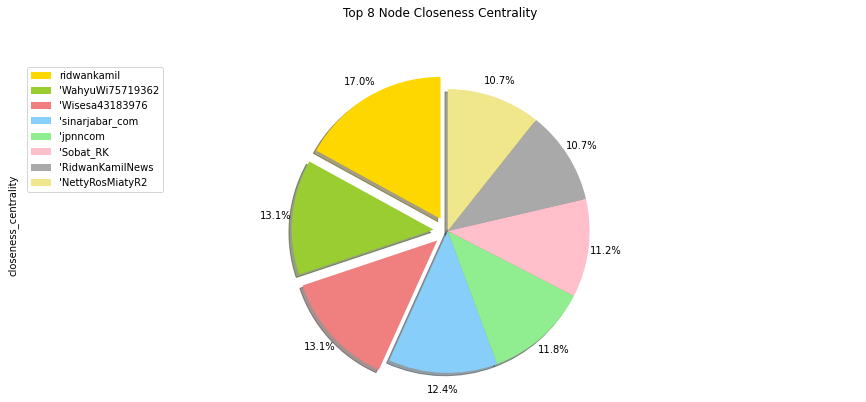

In [ ]:
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink','darkgray','khaki']
explode_list = [0.1, 0.1, 0.1, 0, 0, 0,0,0]

df_visualisasi['closeness_centrality'].plot(kind='pie',
                                            figsize=(15, 6),
                                            autopct='%1.1f%%',
                                            startangle=90,
                                            shadow=True,
                                            labels=None,
                                            pctdistance=1.12,
                                            colors=colors_list,
                                            explode=explode_list
                                            )
plt.title('Top 8 Node Closeness Centrality', y=1.12)
plt.axis('equal')
plt.legend(labels=df_visualisasi.index, loc='upper left')
plt.show()